In [1]:
import tensorflow as tf
import tensorflow_hub as hub

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import pandas as pd
labels = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels.describe())
print(labels.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels["id"]]

# listando os 10 primeiros
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [5]:
import numpy as np
labels_array = labels["breed"].to_numpy()
labels_array[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [6]:
if len(labels_array) == len(filenames):
  print("Número de labels é igual ao número de arquivos!")
else:
  print("Número de labels não bate com o número de arquivos, verifique os dados!")

Número de labels é igual ao número de arquivos!


In [7]:
racas = np.unique(labels_array)
len(racas)

120

In [8]:
boolean_labels = [label == np.array(racas) for label in labels_array]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [9]:
# Ex: transformando um array de boolenas de uma raça em inteiros
print(labels_array[0]) # label de uma raça
print(np.where(racas == labels_array[0])[0][0]) # index referente ao label
print(boolean_labels[0].argmax()) # index onde o label aparece na matriz booleana
print(boolean_labels[0].astype(int)) # convertendo os booleans em inteiros

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [10]:
X = filenames
y = boolean_labels

In [11]:
NUMERO_IMAGENS = 1000
NUMERO_IMAGENS

1000

In [12]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUMERO_IMAGENS],
                                                  y[:NUMERO_IMAGENS],
                                                  test_size=0.2,
                                                  random_state=49)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [13]:
X_train[:3], y_train[:2]

(['drive/MyDrive/Dog Vision/train/146c249bf2d60bf30c309341020bf2ee.jpg',
  'drive/MyDrive/Dog Vision/train/0ba12512fa4766cc4f8c288cb3b9b95f.jpg',
  'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg'],
 [array([False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fa

In [14]:
from matplotlib.pyplot import imread
image = imread(filenames[20]) # lendo uma imagen, no caso de ID 20
image.shape

(375, 500, 3)

In [15]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[127, 128, 120],
        [123, 124, 116],
        [117, 120, 111],
        ...,
        [ 98, 123,  65],
        [ 97, 122,  64],
        [102, 127,  69]],

       [[117, 120, 111],
        [114, 117, 108],
        [112, 115, 106],
        ...,
        [ 97, 122,  64],
        [ 94, 119,  61],
        [ 98, 123,  65]]], dtype=uint8)>

In [16]:
# definindo o tamanho padrão das imagens
IMG_SIZE = 224

def processa_imagem(image_path):
  
  # lendo o arquivo de imagem
  image = tf.io.read_file(image_path)
  # transforma a imagem em um tensor com 3 canais de cores (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # converte os valores do canal de cor de 0-255 para valores entre 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # redimensiona a imagem para o novo shape (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [17]:
def image_label(image_path, label):
  image = processa_imagem(image_path)
  return image, label

In [18]:
# tamanho do lote
BATCH_SIZE = 32

# função que retorna os dados em lotes
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  
  # se os dados forem de teste, não temos rótulos (provavelmente)
  if test_data:
    print("Criando lotes de dados de teste...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(processa_imagem).batch(BATCH_SIZE)
    return data_batch
  
  # se os dados forem de um conjunto válido, não precisamos embaralhar
  elif valid_data:
    print("Criando lotes de dados de validação...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # se os dados forem de treino, embaralhe
    print("Criando lotes de dados de treino...")
    # transformando caminhos de arquivos e rótulos em tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    
    # embaralha os caminhos de arquivos e rótulos
    data = data.shuffle(buffer_size=len(x))

    # cria tuplas (imagem, rótulo)
    data = data.map(image_label)

    # transforma os dados em lotes
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [19]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Criando lotes de dados de treino...
Criando lotes de dados de validação...


In [20]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [21]:
import matplotlib.pyplot as plt

def show_images(images, labels):
  plt.figure(figsize=(10, 10))
  # loop para exibir 25 imagens
  for i in range(25):
    # cria subplots 5 x 5
    ax = plt.subplot(5, 5, i+1)
    # mostra imagem
    plt.imshow(images[i])
    # adiciona label da imagem como título
    plt.title(racas[labels[i].argmax()])
    plt.axis("off")

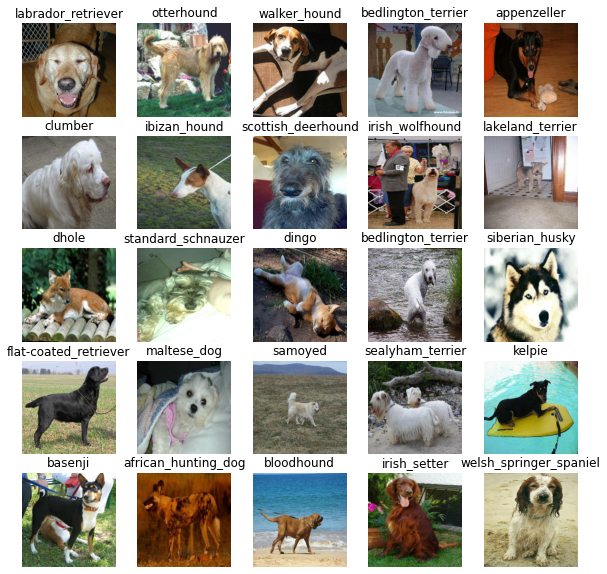

In [22]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_images(train_images, train_labels)

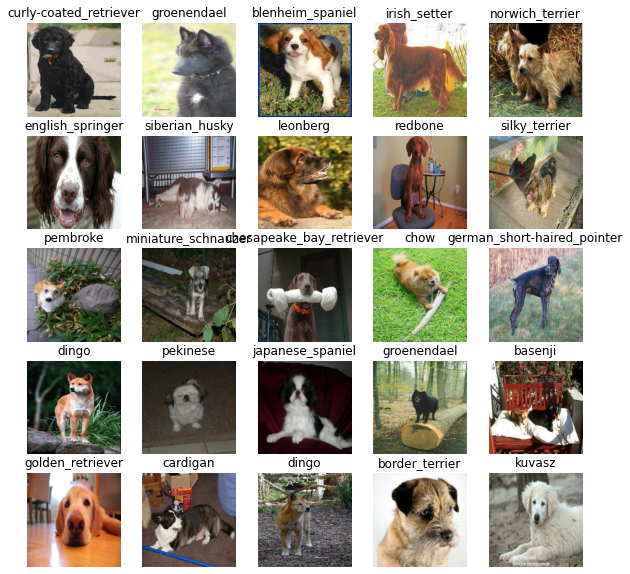

In [23]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_images(val_images, val_labels)

In [24]:
# configurando o formato de entrada para o modelo
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # lote, altura, largura, RGB

# configurado o formato de saída do modelo
OUTPUT_SHAPE = len(racas) # número labels únicos, as 120 raças

# url do modelo que escolhemos no TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [25]:
# função para criar modelo Keras
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Criando modelo com:", MODEL_URL) # url do modelo escolhido no tensorhub

  # configurando as camadas do modelo
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # 1 (camada de entrada)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # 2 (camada de saída)
  ])

  # compilando o modelo
  model.compile(
      # o modelo quer reduzir o percentual de suas suposições
      loss=tf.keras.losses.CategoricalCrossentropy(),
      # essa função diz ao modelo como melhorar os palpites
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"] # o objetivo final é fazer esse valor subir
  )

  # construindo o modelo
  model.build(INPUT_SHAPE)
  
  return model

In [26]:
model = create_model()
model.summary()

Criando modelo com: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Callbacks

In [71]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [28]:
import os
import datetime
def create_tensorboard_callback():
  # cria diretório para armazenar os logs do TensorBoard
  logdir = os.path.join("drive/MyDrive/Data/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [29]:
# criando chamada de interrupção antecipada
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [30]:
print("GPU", "disponível!!!!)" if tf.config.list_physical_devices("GPU") else "not configurada :(")

GPU disponível!!!!)


In [55]:
NUM_EPOCHS = 100

# função para treinar um modelo
def train_model():
  # criando o modelo
  model = create_model()

  # cria uma sessão do TensorBoard toda vez que um modelo for treinado
  tensorboard = create_tensorboard_callback()

  # treina o modelo com os dados e callbacks que criamos
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # verifica a validação de métricas a cada epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [56]:
model = train_model()

Criando modelo com: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 10s 206ms/step - loss: 4.4054 - accuracy: 0.1150 - val_loss: 3.4347 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 5s 180ms/step - loss: 1.5306 - accuracy: 0.7188 - val_loss: 2.2326 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 5s 181ms/step - loss: 0.5243 - accuracy: 0.9475 - val_loss: 1.7791 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 5s 196ms/step - loss: 0.2358 - accuracy: 0.9925 - val_loss: 1.6193 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 5s 184ms/step - loss: 0.1365 - accuracy: 0.9975 - val_loss: 1.5393 - val_accuracy: 0.5900
Epoch 6/100
25/25 [==============================] - 5s 198ms/step - loss: 0.0941 - accuracy: 1.0000 - val_loss: 1.5036 - val_accuracy: 0.6150
Epoch 7/100
25/25 [==============================

In [33]:
%tensorboard --logdir drive/MyDrive/Data/logs

In [34]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 140ms/step


array([[3.3545480e-03, 1.3074738e-03, 2.5954181e-03, ..., 4.3544758e-04,
        8.2830910e-04, 1.0037266e-04],
       [9.2005881e-05, 6.7204249e-04, 1.5574399e-03, ..., 3.9226201e-04,
        3.5458221e-04, 3.5839581e-05],
       [3.8579388e-03, 1.4713424e-03, 1.8075896e-04, ..., 1.8035613e-04,
        3.3950605e-03, 3.3643956e-03],
       ...,
       [1.2904026e-03, 1.2523183e-04, 2.8392419e-04, ..., 3.4524204e-04,
        1.2659383e-03, 7.1542915e-03],
       [8.1263795e-05, 1.3693397e-04, 5.2499036e-05, ..., 8.2751765e-05,
        5.8574369e-04, 3.6514158e-04],
       [1.0789788e-02, 3.6321118e-04, 2.0270815e-04, ..., 1.2442422e-03,
        4.4923194e-04, 9.2771426e-03]], dtype=float32)

In [35]:
predictions.shape

(200, 120)

In [36]:
print(predictions[0])
print(f"Valor Máximo (probabilidade de previsão): {np.max(predictions[0])}")
print(f"Soma total: {np.sum(predictions[0])}")
print(f"Max index: {np.argmax(predictions[0])}")
print(f"Rótulo previsto: {racas[np.argmax(predictions[0])]}")

[3.3545480e-03 1.3074738e-03 2.5954181e-03 3.8542128e-03 5.4082688e-04
 1.7149351e-03 7.6718112e-05 1.8324723e-04 2.9258174e-04 9.6408497e-05
 2.2057267e-03 1.4479324e-03 3.3091456e-03 1.0507324e-03 1.9241048e-03
 5.1717728e-04 4.4508552e-04 7.3659857e-04 7.5426750e-04 4.3317508e-05
 4.5239057e-02 6.3655706e-04 1.3930163e-03 6.7301411e-03 2.8940761e-03
 1.6095919e-03 4.2330773e-04 1.6577388e-04 1.6003482e-02 1.4053048e-04
 5.1585294e-04 1.9713826e-03 1.0748077e-02 2.2013327e-04 3.5543299e-01
 4.0534581e-03 2.8944553e-03 1.2212469e-04 1.1961734e-03 4.8860523e-04
 7.1943470e-04 1.6926108e-04 2.8541025e-03 5.0975801e-04 5.9174914e-03
 2.4830003e-04 6.1788171e-04 5.3763394e-03 1.6284093e-03 1.6344888e-03
 6.0439650e-03 2.6979665e-03 6.0173887e-04 1.9608939e-03 3.5606402e-03
 3.2342854e-04 1.3692410e-03 6.3121587e-04 3.2767245e-01 1.5674871e-04
 1.6251489e-04 1.0103548e-03 3.4529998e-04 7.7523605e-04 4.3273149e-03
 1.3022646e-03 4.3094596e-03 2.1767083e-03 2.0559515e-04 2.1978022e-04
 8.054

In [37]:
def get_pred_label(prediction_probabilities):
  return racas[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[0])
pred_label

'curly-coated_retriever'

In [38]:
def unbatchify(data):
  images = []
  labels = []
  # Loop para extrair os dados do lote
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(racas[np.argmax(label)])
  return images, labels

# desagrupa os dados de validação do lote
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.76940656, 0.61646533, 0.55762434],
         [0.81231624, 0.659375  , 0.59270835],
         [0.7924496 , 0.6395522 , 0.57271045],
         ...,
         [0.24606322, 0.39503905, 0.19503903],
         [0.21724598, 0.3737171 , 0.16592647],
         [0.2580486 , 0.40317228, 0.1992419 ]],
 
        [[0.7796394 , 0.6266982 , 0.5678572 ],
         [0.82255596, 0.66961473, 0.60294807],
         [0.8037466 , 0.6508491 , 0.5840074 ],
         ...,
         [0.23005337, 0.37902918, 0.17902917],
         [0.23136453, 0.38427946, 0.17648883],
         [0.24582711, 0.39094278, 0.18803424]],
 
        [[0.79345626, 0.640515  , 0.58167404],
         [0.8380953 , 0.6851655 , 0.618476  ],
         [0.822183  , 0.6709734 , 0.600794  ],
         ...,
         [0.20882815, 0.35780394, 0.15780395],
         [0.22443976, 0.37735468, 0.16956405],
         [0.22795103, 0.36795735, 0.16964287]],
 
        ...,
 
        [[0.91892123, 0.86402804, 0.85223705],
         [0.7253098 , 0.6743294 , 0.6508 

In [39]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # pega o rótulo previsto
  pred_label = get_pred_label(pred_prob)
  
  # plotando a imagem
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # altera a cor do título dependendo da previsão estar certa ou errada
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

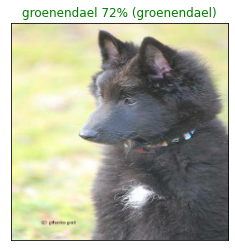

In [40]:
# exemplo de previsão
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [41]:
def plot_pred_conf(prediction_probabilities, labels, n=1):

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # pega o rótulo previsto
  pred_label = get_pred_label(pred_prob)

  # encontra o top 10 para previsões
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = racas[top_10_pred_indexes]

  # configura o plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # altera a cor do título conforme a previsão (certa/errada)
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

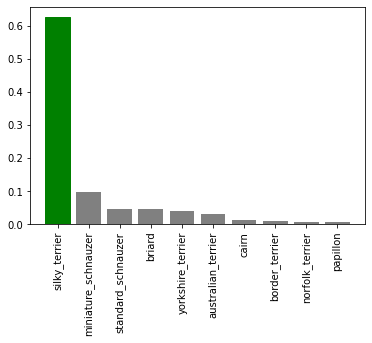

In [42]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

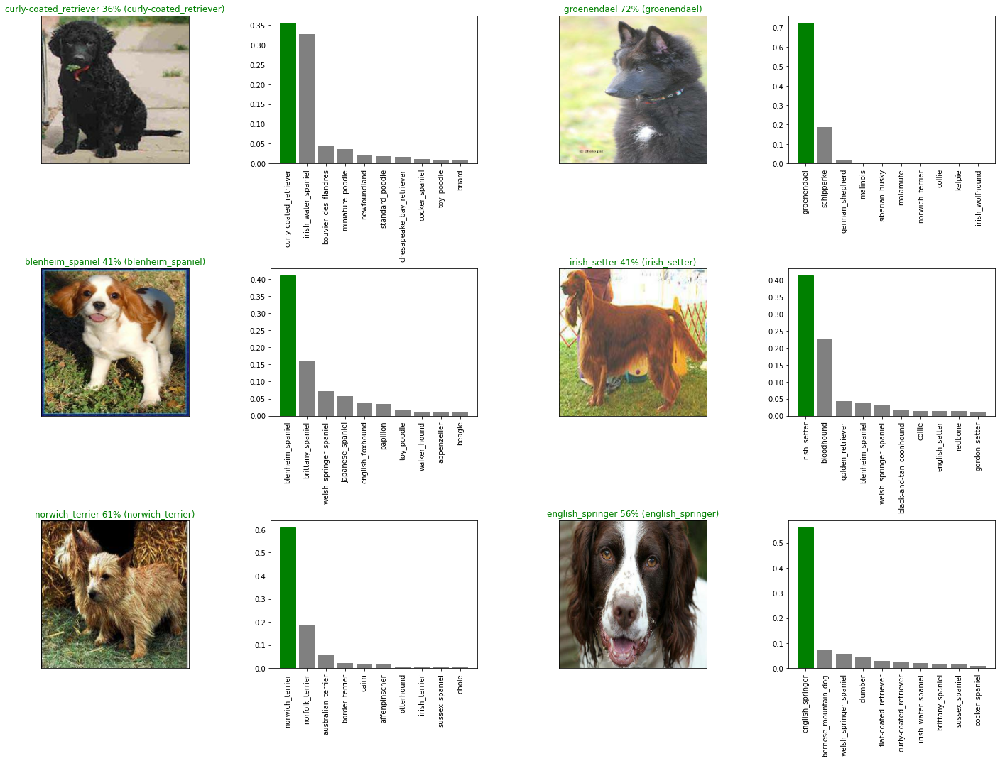

In [43]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [45]:
def save_model(model, suffix=None):
  
  # criando o diretório onde o modelo sera salvo
  modeldir = os.path.join("drive/MyDrive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # formato do modelo
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [46]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [47]:
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/MyDrive/Data/models/20220221-20161645474573-1000-images-Adam.h5...


'drive/MyDrive/Data/models/20220221-20161645474573-1000-images-Adam.h5'

In [48]:
len(X), len(y)

(10222, 10222)

In [49]:
full_data = create_data_batches(X, y)

Criando lotes de dados de treino...


In [50]:
full_model = create_model()

Criando modelo com: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [51]:
# TensorBoard
full_model_tensorboard = create_tensorboard_callback()

# Early stopping
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [54]:
%tensorboard --logdir drive/MyDrive/Data/logs

Reusing TensorBoard on port 6006 (pid 808), started 3:02:27 ago. (Use '!kill 808' to kill it.)

<IPython.core.display.Javascript object>

In [53]:
# treinando o modelo com todos os dados de treino
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2029s 6s/step - loss: 1.3648 - accuracy: 0.6662
Epoch 2/100
320/320 [==============================] - 48s 149ms/step - loss: 0.4053 - accuracy: 0.8808
Epoch 3/100
320/320 [==============================] - 51s 158ms/step - loss: 0.2366 - accuracy: 0.9348
Epoch 4/100
320/320 [==============================] - 51s 159ms/step - loss: 0.1580 - accuracy: 0.9613
Epoch 5/100
320/320 [==============================] - 49s 154ms/step - loss: 0.1063 - accuracy: 0.9775
Epoch 6/100
320/320 [==============================] - 49s 154ms/step - loss: 0.0783 - accuracy: 0.9858
Epoch 7/100
320/320 [==============================] - 49s 153ms/step - loss: 0.0594 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 49s 154ms/step - loss: 0.0454 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 48s 150ms/step - loss: 0.0367 - accuracy: 0.9968
Epoch 10/100
320/320 [==============================] - 51s 158ms

In [63]:
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e1deaf47925c840d804d7ff0324ee1fe.jpg',
 'drive/MyDrive/Dog Vision/test/e0a6b866af64299ecf76f7cb11c80674.jpg',
 'drive/MyDrive/Dog Vision/test/e4b7ff61849485992246c0f2ab7e8804.jpg',
 'drive/MyDrive/Dog Vision/test/e699b20911a55abda3558c5bcd37443d.jpg',
 'drive/MyDrive/Dog Vision/test/de5496c6b58f66ab890ab24087d9e220.jpg',
 'drive/MyDrive/Dog Vision/test/e219af838e1d6a18224eb9b478944778.jpg',
 'drive/MyDrive/Dog Vision/test/e73dc6a8f2d7c941f28c0a5298bc5bdc.jpg',
 'drive/MyDrive/Dog Vision/test/e0a21cb0d8d3014b6c56230350a9362f.jpg',
 'drive/MyDrive/Dog Vision/test/e47bc25097050ba689b64de02c725837.jpg',
 'drive/MyDrive/Dog Vision/test/e09f4ff3f7acee994812650a2fc7edef.jpg']

In [64]:
test_data = create_data_batches(test_filenames, test_data=True)

Criando lotes de dados de teste...


In [65]:
test_predictions = full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 208s 622ms/step


In [66]:
# verificando as previsões nos dados de teste
test_predictions[:10]

array([[4.0301520e-06, 4.1828032e-05, 1.5791221e-09, ..., 3.9228894e-06,
        3.4770914e-10, 2.3396865e-10],
       [2.7395019e-11, 7.6133766e-08, 1.5362861e-09, ..., 2.7218279e-05,
        8.2300048e-06, 5.3789286e-11],
       [7.5121376e-12, 2.1255443e-10, 3.2456470e-13, ..., 9.6879893e-10,
        1.4016718e-09, 2.6680713e-09],
       ...,
       [7.0882045e-08, 5.0273874e-10, 2.3055667e-11, ..., 7.0060409e-11,
        4.2239805e-15, 5.2385742e-14],
       [1.6729247e-07, 3.7636589e-08, 2.7725382e-09, ..., 6.2566934e-09,
        1.7995176e-06, 3.9208203e-07],
       [3.8880444e-11, 1.5927676e-11, 1.9205317e-09, ..., 2.9934097e-10,
        6.6410523e-11, 6.0468192e-10]], dtype=float32)

In [67]:
# pegando o caminho de arquivo para a imagem personalizada
custom_path = "drive/MyDrive/Data/dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

# transforma a imagem personalizada em lote
custom_data = create_data_batches(custom_image_paths, test_data=True)

# faz previsões com os dados personalizados
custom_preds = full_model.predict(custom_data)

Criando lotes de dados de teste...


In [68]:
# lista rótulos de previsão de imagem personalizados
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['chow']

In [69]:
# pega a imagem personalizada
custom_images = []
# loop para percorrer os dados fora de lote
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

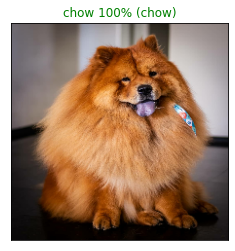

In [70]:
# plotando a imagem
plot_pred(prediction_probabilities=custom_preds,
          labels=custom_pred_labels,
          images=custom_images, n=0)